In [41]:

import os

import mne
import numpy as np
import scipy
from einops import rearrange, repeat
from einops.layers.torch import Rearrange
from torch import nn

from renaanalysis.utils.utils import visualize_eeg_epochs
from torch import optim, nn
from torch.optim import lr_scheduler
from sklearn import preprocessing
from renaanalysis.utils.data_utils import z_norm_by_trial
from tqdm import tqdm


User parameters

In [33]:
data_root = r'C:\Users\apoca\Downloads'
subject = 'A03'
eeg_channels = {'Fz', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6',  'CP3', 'CP1', 'CPz',  'CP2', 'CP4', 'P1', 'Pz', 'P2', 'POz'}
srate = 250
montage = mne.channels.make_standard_montage('standard_1020')
lowcut_eeg = 4
highcut_eeg = 40
n_jobs = 1
epoch_tmin = 0.
epoch_tmax = 4.
event_id = {'left': 1, 'right': 2, 'foot': 3, 'tongue': 4}
event_viz_colors = {'left': 'red', 'right': 'blue', 'foot': 'green', 'tongue': 'yellow'}

batch_size = 32
lr = 1e-4
num_epochs = 100
l2_weight = 1e-5

Load the data

In [36]:

def load_mat_sessions(file_path, figure_title):
    this_epoch_tmax = epoch_tmax - 1 / srate
    data = scipy.io.loadmat(file_path)['data']
    all_epochs = []
    for session_i in range(data.shape[1]):
        ys = data[0, session_i]['y'][0, 0]
        if len(ys) == 0:
            print(f"session {session_i} of {data.shape[1]} does not have labels, skipping")
            continue
        # the last three channels are eog, so we skip them
        eeg = data[0, session_i]['X'][0, 0][:, :-3]
        trial_start_indices = data[0, session_i]['trial'][0, 0]
        # create mne data structure
        info = mne.create_info(ch_names=list(eeg_channels), sfreq=srate, ch_types='eeg')
        raw = mne.io.RawArray(eeg.T, info)
        raw.set_montage(montage)
        raw, _ = mne.set_eeg_reference(raw, 'average', projection=False)
        raw = raw.filter(l_freq=lowcut_eeg, h_freq=highcut_eeg, n_jobs=n_jobs, picks='eeg')
        
        # create events array from trial start indices
        events = np.array(np.concatenate([trial_start_indices, np.zeros((len(trial_start_indices), 1)), ys], axis=1), dtype=int)
        epoch = mne.Epochs(raw, events, event_id=event_id, tmin=epoch_tmin, tmax=this_epoch_tmax,
                      baseline=(epoch_tmin, epoch_tmin + (epoch_tmax - epoch_tmin) * 0.1), preload=True,
                      event_repeated='drop')
        all_epochs.append(epoch)
    epochs = mne.concatenate_epochs(all_epochs)
    visualize_eeg_epochs(epochs, event_id, event_viz_colors, tmin_eeg_viz=epoch_tmin, tmax_eeg_viz=epoch_tmax, eeg_picks=eeg_channels, title=figure_title)
    return epochs




session 0 of 9 does not have labels, skipping
session 1 of 9 does not have labels, skipping
session 2 of 9 does not have labels, skipping
Creating RawArray with float64 data, n_channels=22, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 sec)

Not setting metadata
48 matching events found
Applying base

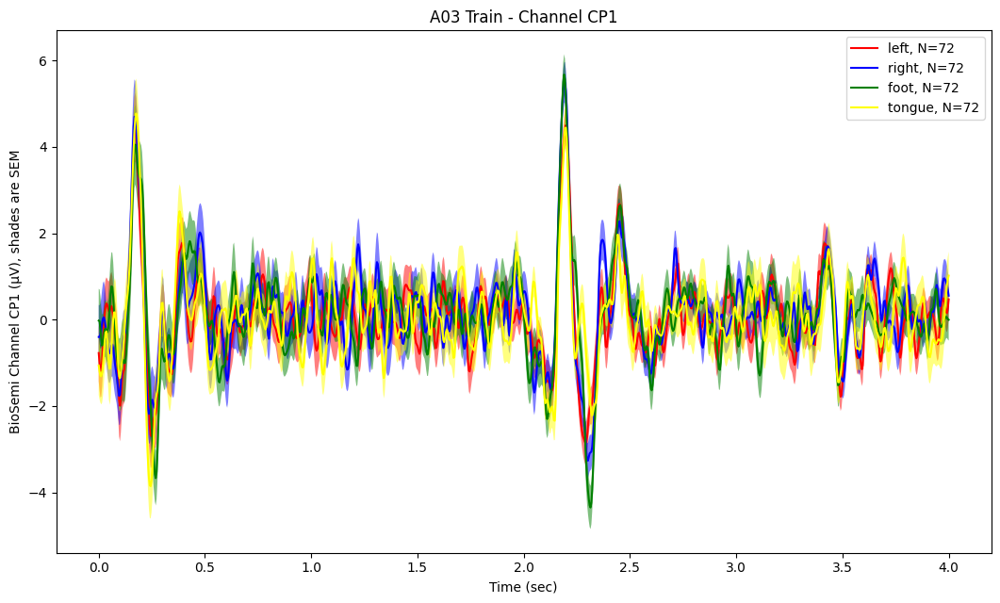

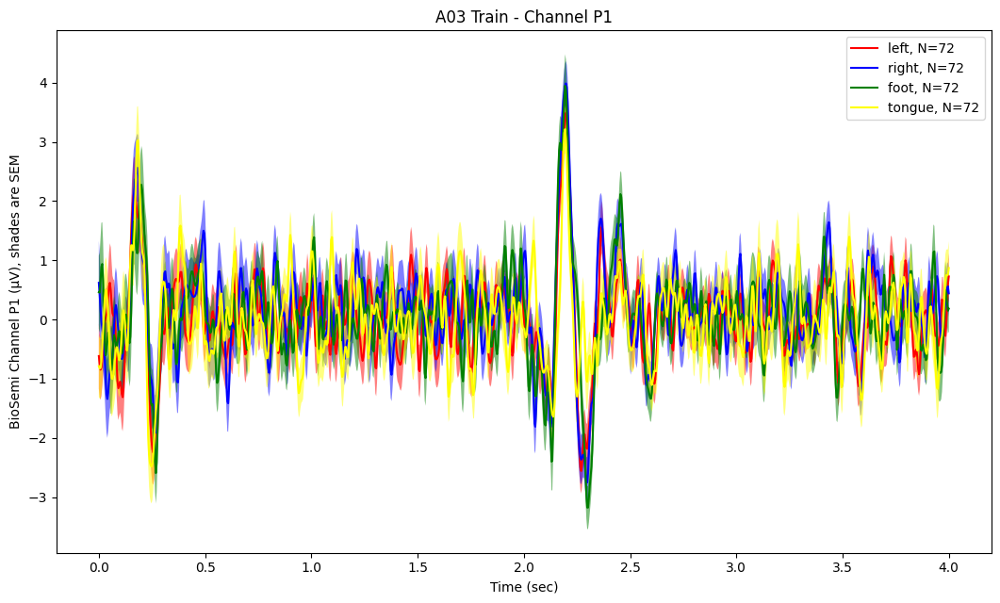

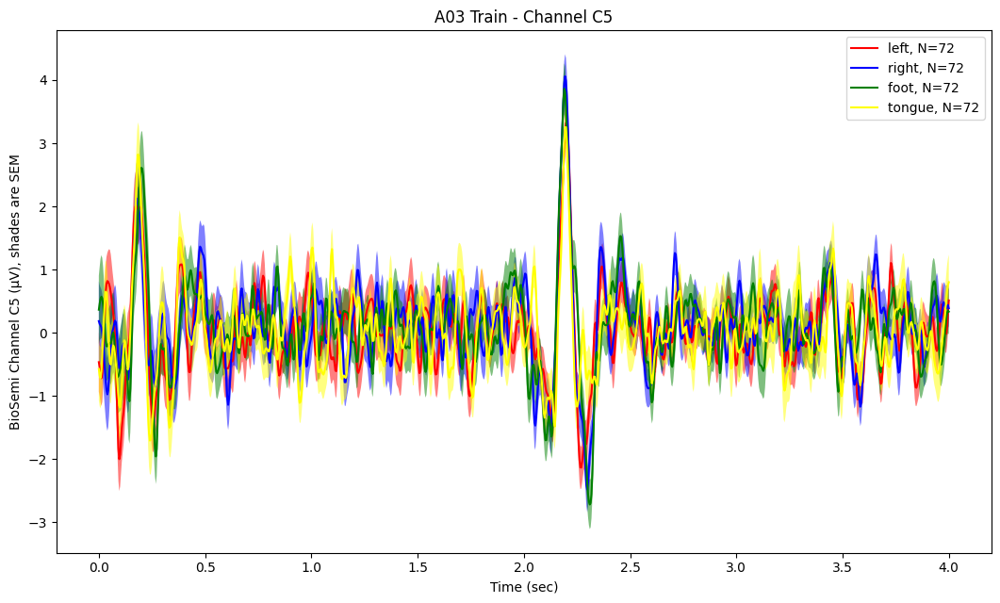

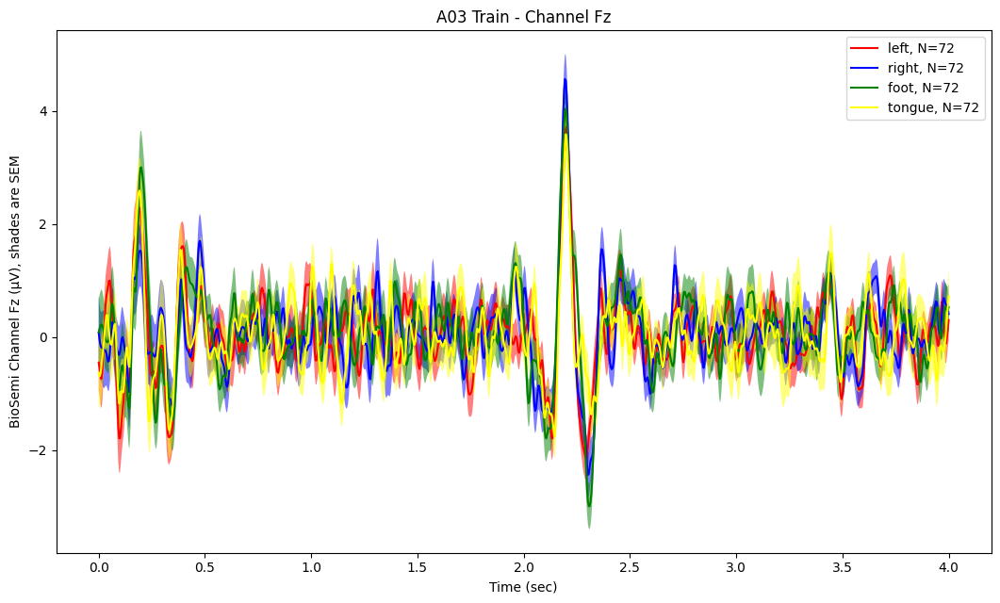

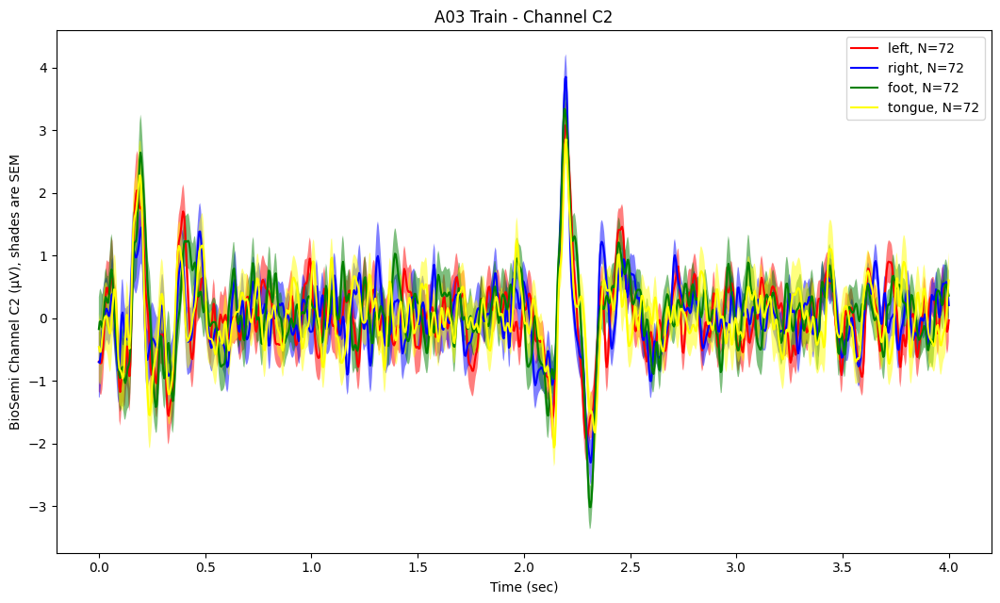

...

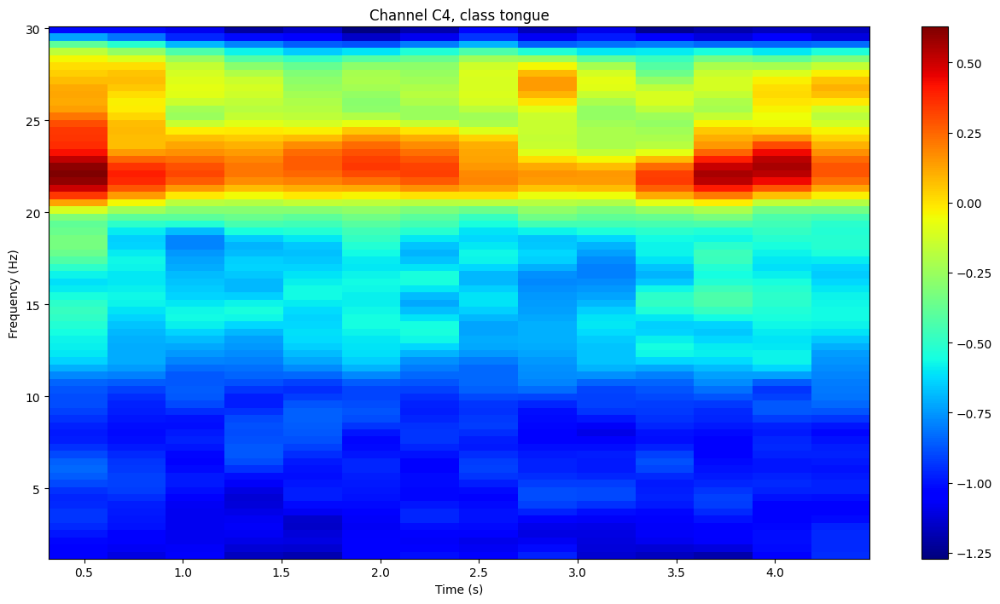

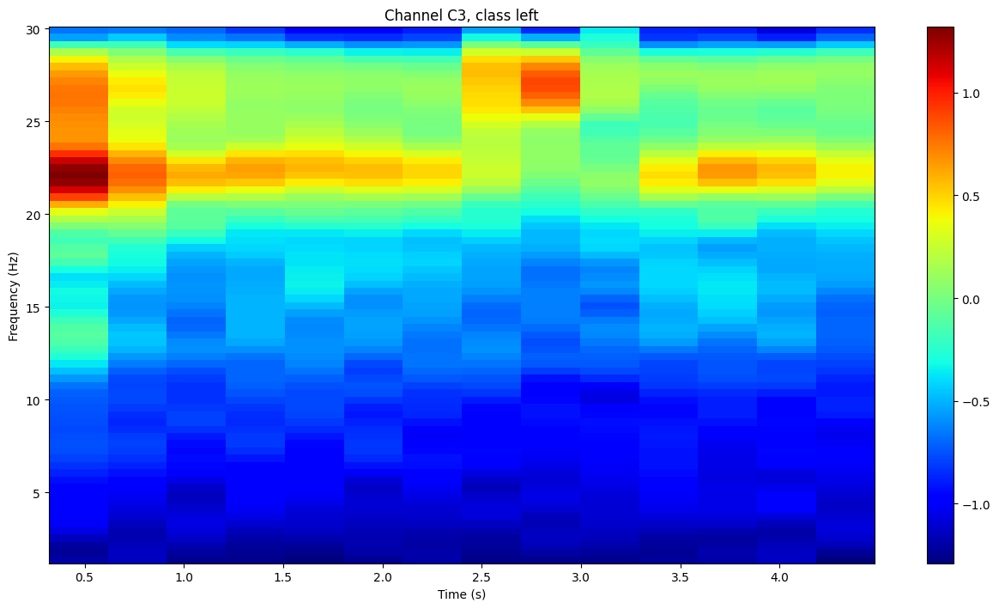

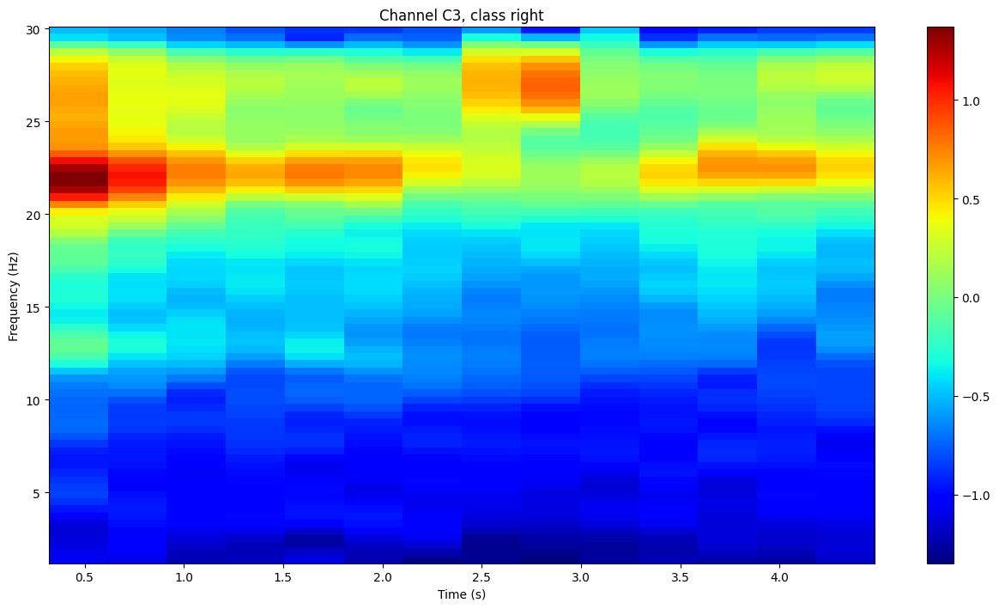

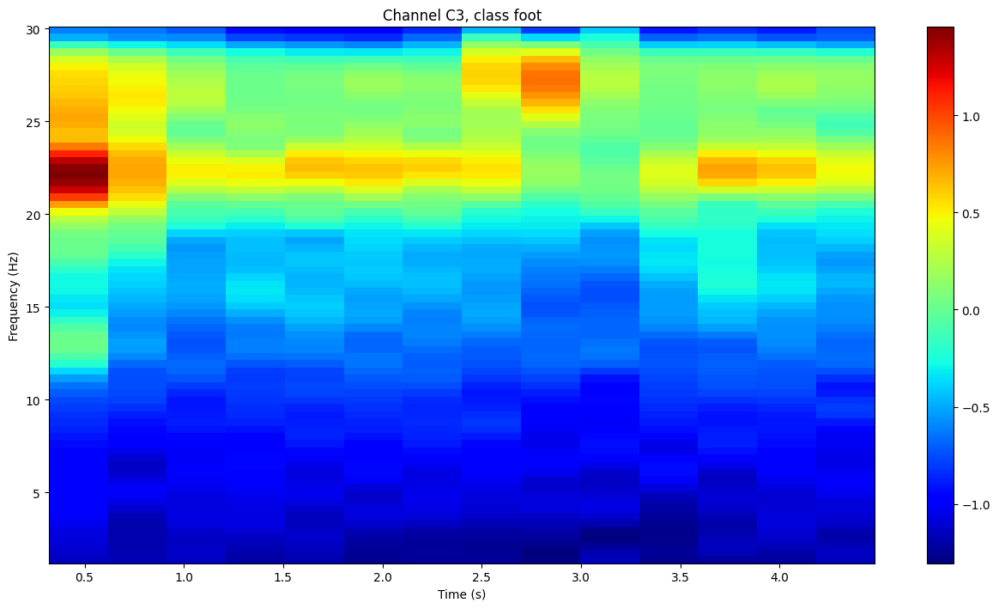

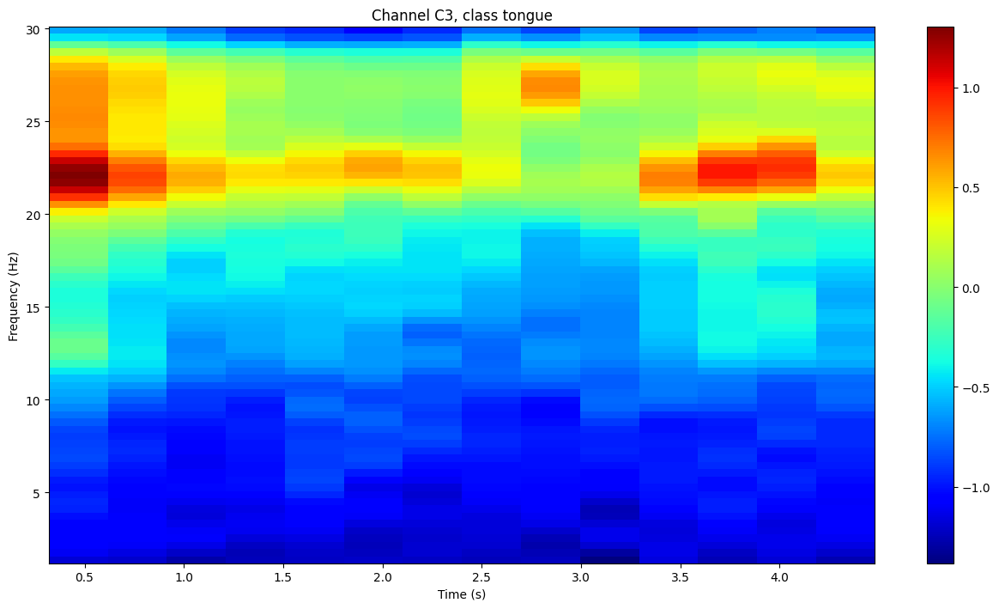

session 0 of 9 does not have labels, skipping
session 1 of 9 does not have labels, skipping
session 2 of 9 does not have labels, skipping
Creating RawArray with float64 data, n_channels=22, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 413 samples (1.652 sec)

Not setting metadata
48 matching events found
Applying base

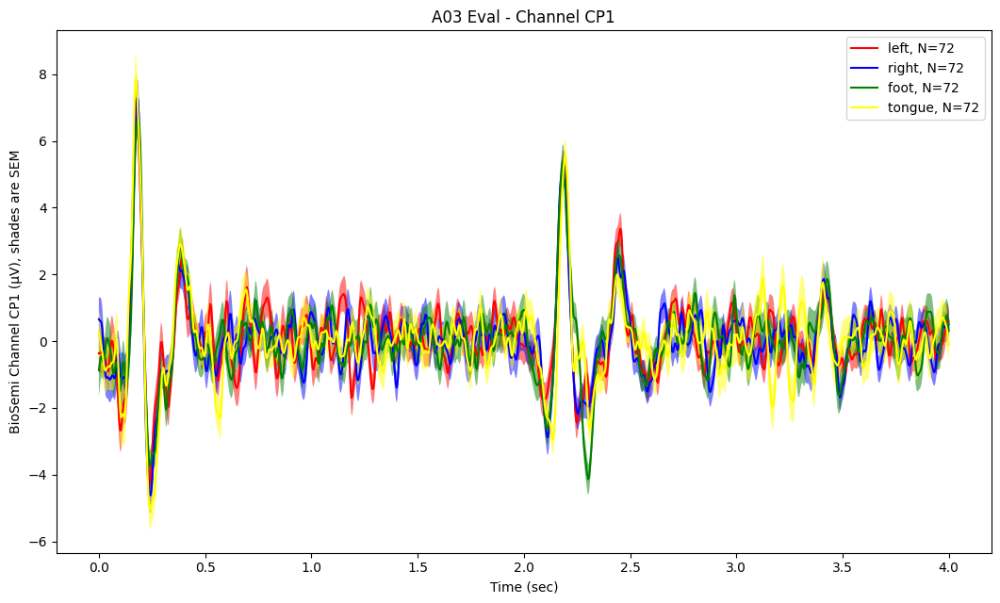

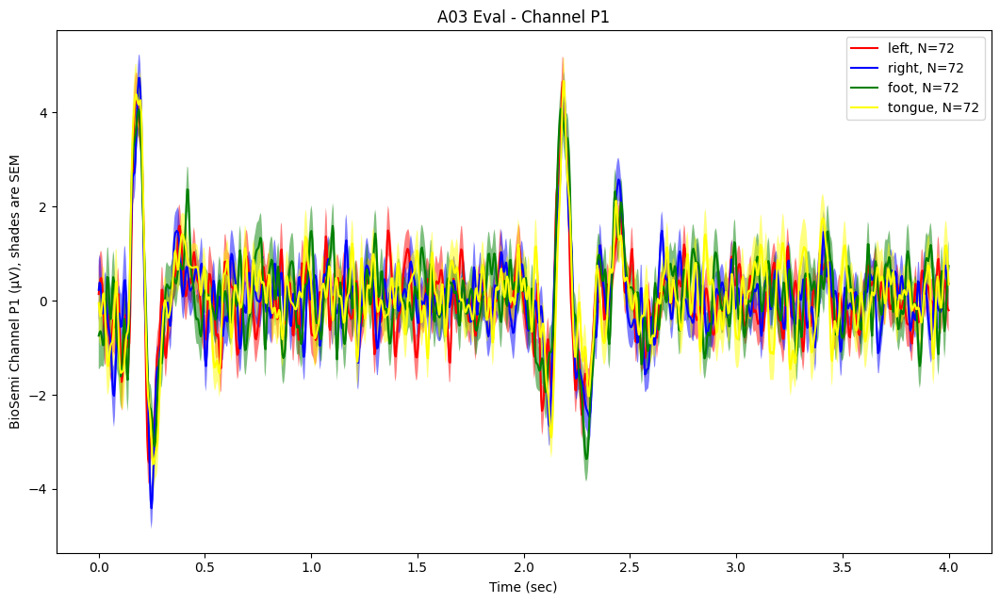

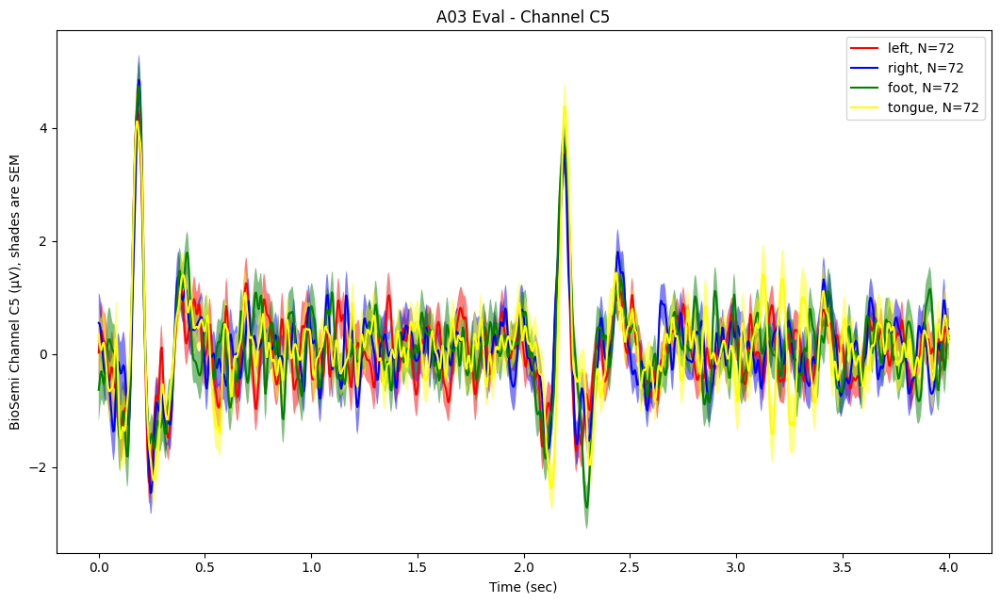

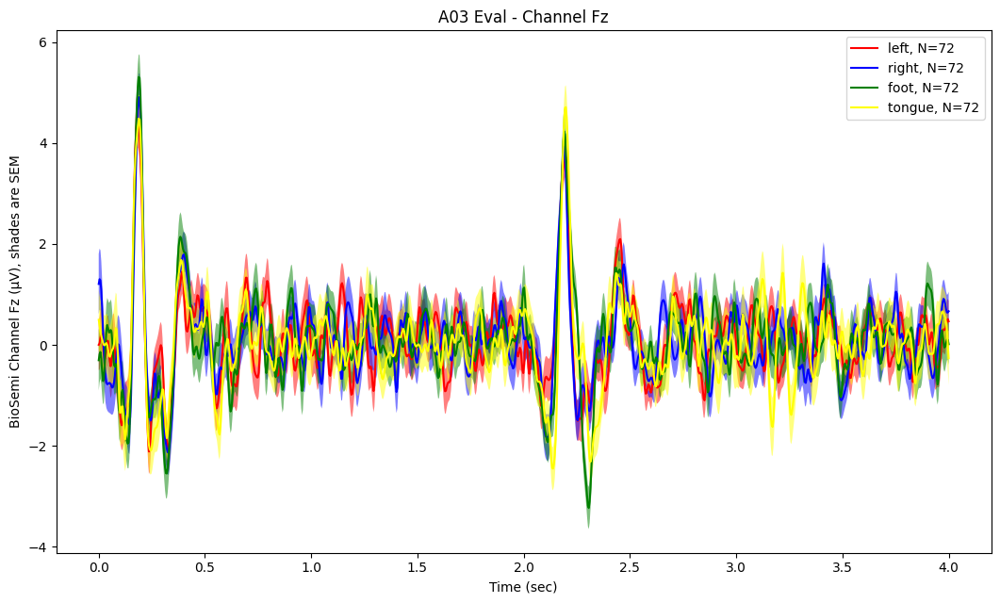

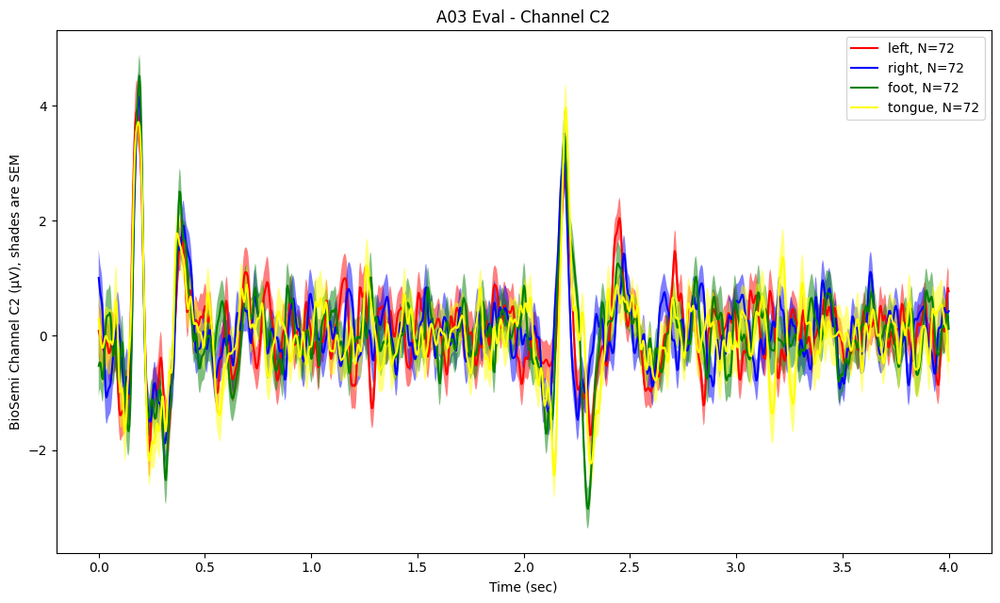

...

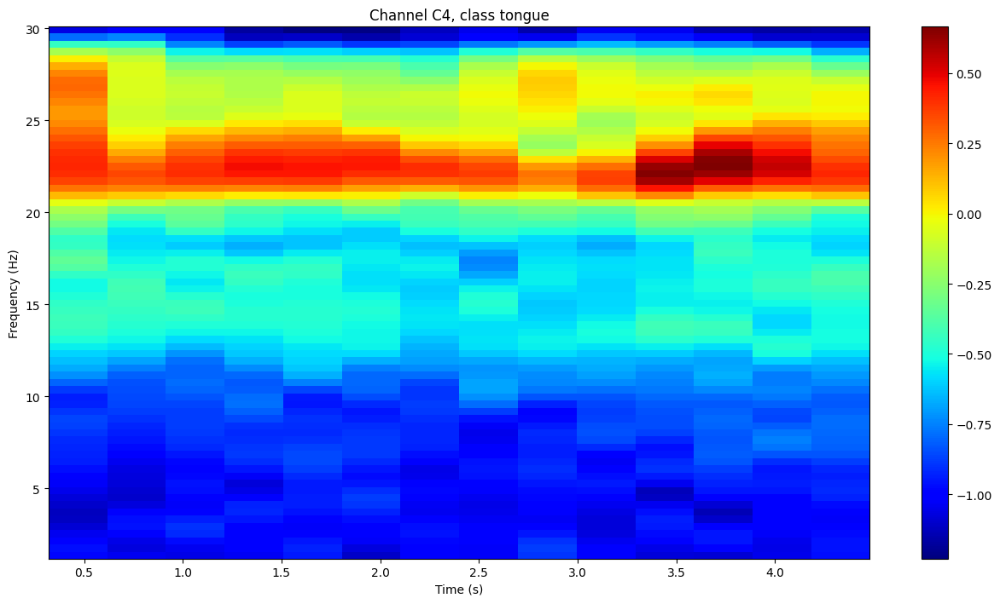

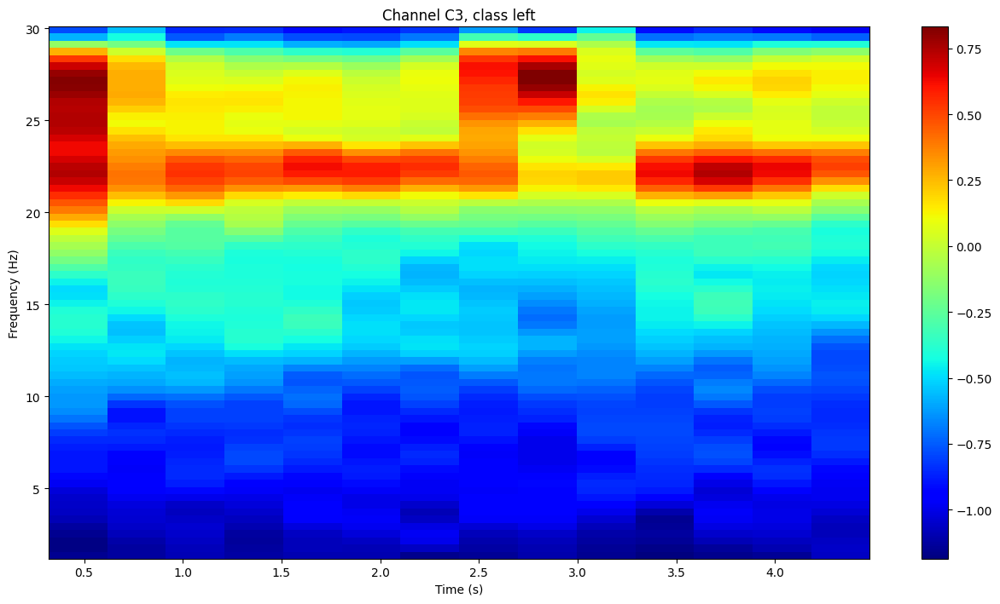

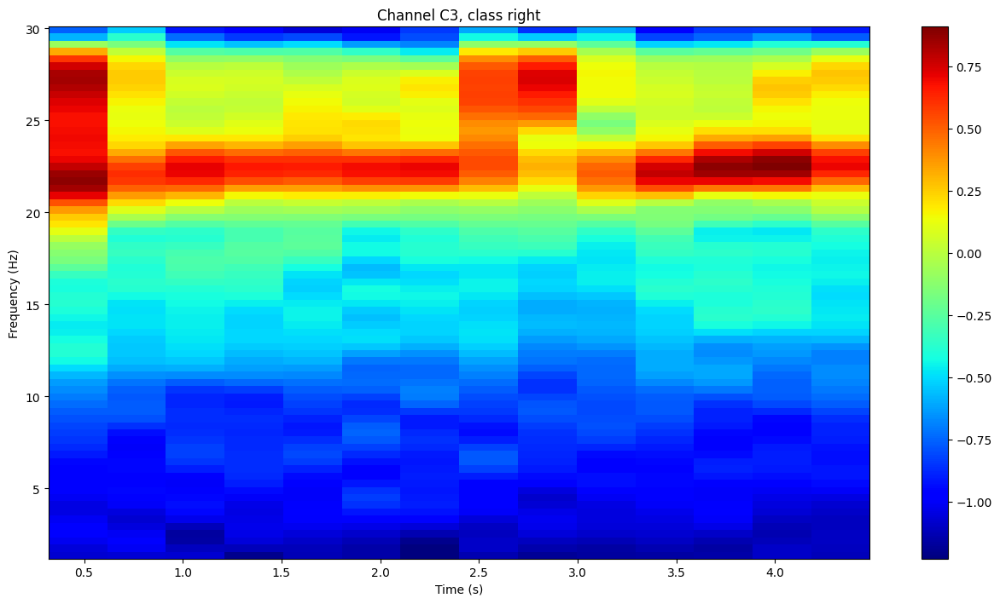

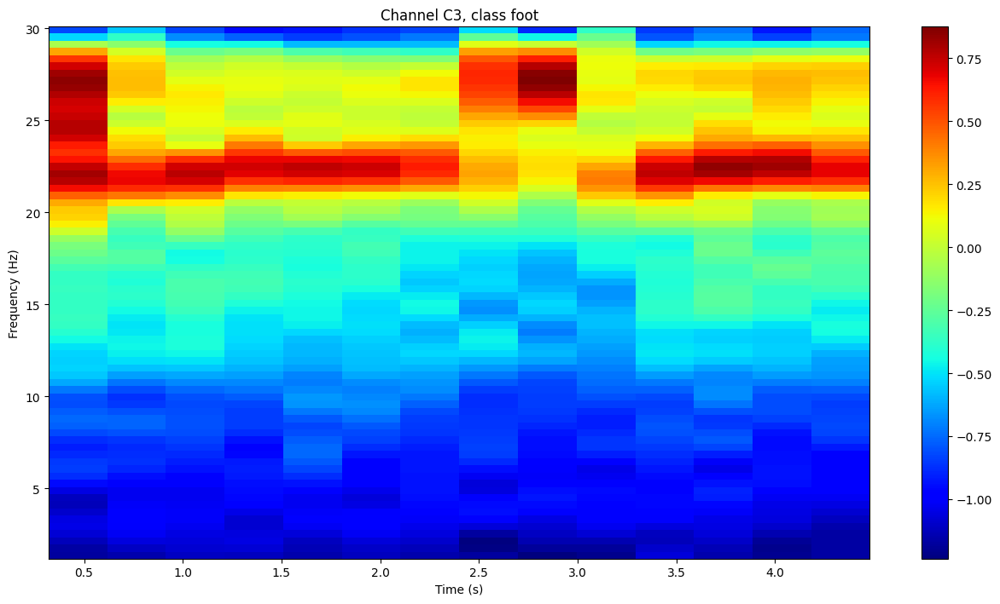

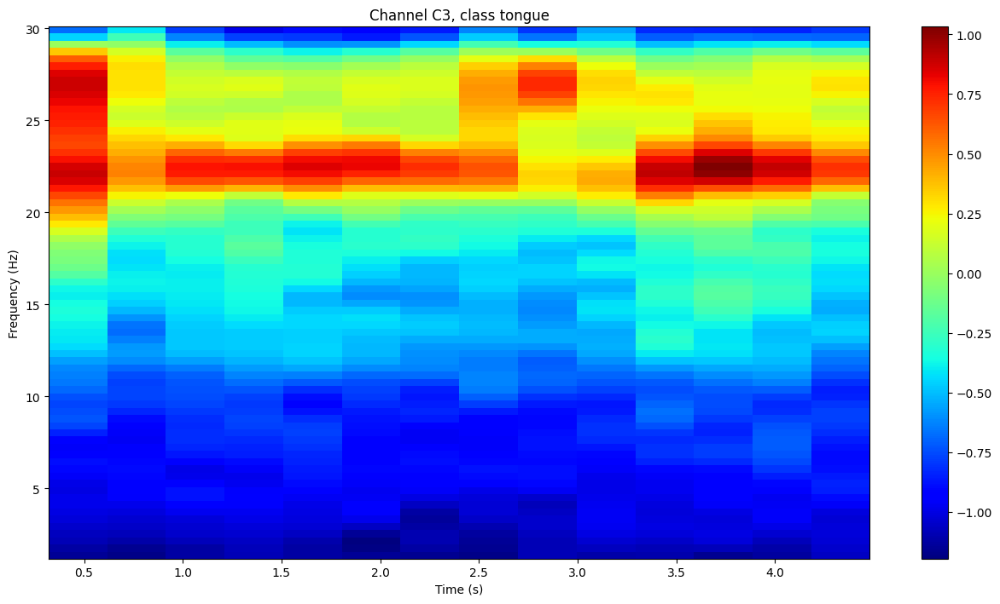

In [37]:
train_path = os.path.join(data_root, f'{subject}T.mat')
eval_path = os.path.join(data_root, f'{subject}E.mat')

train_epochs = load_mat_sessions(train_path, f'{subject} Train')
eval_epochs = load_mat_sessions(eval_path, f'{subject} Eval')

In [72]:
a = scipy.io.loadmat(train_path)

In [38]:
class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.norm = nn.LayerNorm(dim)
        self.fn = fn

    def forward(self, x, **kwargs):
        return self.fn(self.norm(x), **kwargs)


class FeedForward(nn.Module):
    def __init__(self, dim, hidden_dim, dropout=0.):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, dim),
            nn.Dropout(dropout)
        )

    def forward(self, x):
        return self.net(x)


class Attention(nn.Module):
    def __init__(self, dim, heads=8, dim_head=64, dropout=0.):
        super().__init__()
        inner_dim = dim_head * heads
        project_out = not (heads == 1 and dim_head == dim)

        self.heads = heads
        self.scale = dim_head ** -0.5

        self.attend = nn.Softmax(dim=-1)
        self.dropout = nn.Dropout(dropout)

        self.to_qkv = nn.Linear(dim, inner_dim * 3, bias=False)

        self.to_out = nn.Sequential(
            nn.Linear(inner_dim, dim),
            nn.Dropout(dropout)
        ) if project_out else nn.Identity()

    def forward(self, x):
        qkv = self.to_qkv(x).chunk(3, dim=-1)
        q, k, v = map(lambda t: rearrange(t, 'b n (h d) -> b h n d', h=self.heads), qkv)

        dots = torch.matmul(q, k.transpose(-1, -2)) * self.scale

        attention = self.attend(dots)
        attention = self.dropout(attention)  # TODO

        out = torch.matmul(attention, v)
        out = rearrange(out, 'b h n d -> b n (h d)')
        return self.to_out(out), attention


class Transformer(nn.Module):
    def __init__(self, dim, depth, heads, dim_head, feedforward_mlp_dim, dropout=0.):
        super().__init__()
        self.layers = nn.ModuleList([])
        for _ in range(depth):
            self.layers.append(nn.ModuleList([
                PreNorm(dim, Attention(dim, heads=heads, dim_head=dim_head, dropout=dropout)),
                PreNorm(dim, FeedForward(dim, feedforward_mlp_dim, dropout=dropout))
            ]))

    def forward(self, x):
        for prenorm_attention, prenorm_feedforward in self.layers:
            out, attention = prenorm_attention(x)
            x = out + x
            x = prenorm_feedforward(x) + x
        return x, attention  # last layer


class PhysioTransformer(nn.Module):
    def __init__(self, num_timesteps, num_channels, sampling_rate, num_classes, depth=4, num_heads=8, feedforward_mlp_dim=32, window_duration=0.1, pool='cls',
                 patch_embed_dim=128, dim_head=64, attn_dropout=0.5, emb_dropout=0.5, output='multi'):
        """

        # a token is a time slice of data on a single channel

        @param num_timesteps: int: number of timesteps in each sample
        @param num_channels: int: number of channels of the input data
        @param output: str: can be 'single' or 'multi'. If 'single', the output is a single number to be put with sigmoid activation. If 'multi', the output is a vector of size num_classes to be put with softmax activation.
        note that 'single' only works when the number of classes is 2.
        """
        if output == 'single':
            assert num_classes == 2, 'output can only be single when num_classes is 2'
        super().__init__()
        self.depth = depth
        self.num_heads = num_heads
        self.window_duration = window_duration

        self.num_channels = num_channels
        self.num_timesteps = num_timesteps
        self.path_embed_dim = patch_embed_dim
        self.patch_length = int(window_duration * sampling_rate)
        self.num_windows = num_timesteps // self.patch_length

        self.grid_dims = self.num_channels, self.num_windows
        self.num_patches = self.num_channels * self.num_windows

        assert pool in {'cls', 'mean'}, 'pool type must be either cls (cls token) or mean (mean pooling)'

        self.to_patch_embedding = nn.Sequential(
            Rearrange('b c t -> b 1 c t', c=self.num_channels, t=self.num_timesteps),
            nn.Conv2d(1, patch_embed_dim, kernel_size=(1, self.patch_length), stride=(1, self.patch_length), bias=True),
        )

        self.pos_embedding = nn.Parameter(torch.randn(1, self.num_patches + 1, patch_embed_dim))
        self.cls_token = nn.Parameter(torch.randn(1, 1, patch_embed_dim))
        self.dropout = nn.Dropout(emb_dropout)

        self.transformer = Transformer(patch_embed_dim, depth, num_heads, dim_head, feedforward_mlp_dim, attn_dropout)

        self.pool = pool
        self.to_latent = nn.Identity()

        if output == 'single':
            self.mlp_head = nn.Sequential(
                nn.LayerNorm(patch_embed_dim),
                nn.Linear(patch_embed_dim, 1))
        else:
            self.mlp_head = nn.Sequential(
                nn.LayerNorm(patch_embed_dim),
                nn.Linear(patch_embed_dim, num_classes))

    def forward(self, x_eeg):
            x = self.encode(x_eeg)
            return self.mlp_head(x)

    def encode(self, x_eeg):
        x = self.to_patch_embedding(x_eeg)
        x = x.flatten(2).transpose(1, 2)  # BCHW -> BNC

        b, n, _ = x.shape

        cls_tokens = repeat(self.cls_token, '1 1 d -> b 1 d', b=b)
        x = torch.cat((cls_tokens, x), dim=1)
        x += self.pos_embedding[:, :(n + 1)]
        x = self.dropout(x)

        x, att_matrix = self.transformer(x)
        x = x.mean(dim=1) if self.pool == 'mean' else x[:, 0]
        x = self.to_latent(x)
        return x

In [53]:

import math


class EEGCNN(nn.Module):
    def __init__(self, in_shape, num_classes, num_filters=16):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(in_shape[1], num_filters, 5),
            nn.ReLU(),
            nn.BatchNorm1d(num_filters),
            nn.MaxPool1d(2),

            nn.Conv1d(num_filters, num_filters, 5),
            nn.ReLU(),
            nn.BatchNorm1d(num_filters),
            nn.MaxPool1d(2),

            nn.Conv1d(num_filters, num_filters, 5),
            nn.ReLU(),
            nn.BatchNorm1d(num_filters),
            nn.MaxPool1d(2),
            nn.Flatten()
        )

        # with torch.no_grad():
        #     cnn_flattened_size = self.conv(torch.rand(in_shape)).shape[1]

        # out_size = math.floor((math.floor((math.floor((in_shape[-1] -6)/2+1) -6)/2+1) - 6)/2 + 1) * num_filters

        self.fcs = nn.Sequential(
            nn.Linear(1936, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Linear(32, num_classes)
        )

    def forward(self, input):
        x = self.conv(input)
        x = self.fcs(x)
        return x

    def prepare_data(self, x):
        return x

    def forward_without_classification(self, input):
        x = self.conv(input)
        for fc in self.fcs[:-1]:
            x = fc(x)
        return x

In [61]:


# get the data as numpy arrays for training
label_onehot_encoder = preprocessing.OneHotEncoder()

# X_train = train_epochs.get_data()
# X_train = z_norm_by_trial(X_train)
# Y_train = train_epochs.events[:, -1] - 1 
# Y_train = label_onehot_encoder.fit_transform(Y_train.reshape(-1, 1)).toarray()
# 
# X_eval = eval_epochs.get_data()
# X_eval = z_norm_by_trial(X_eval)
# Y_eval = eval_epochs.events[:, -1] - 1  # subtract 1 to change range from [1, 4] to [0, 3]
# Y_eval = label_onehot_encoder.transform(Y_eval.reshape(-1, 1)).toarray()


X_train = eval_epochs.get_data()
X_train = z_norm_by_trial(X_train)
Y_train = eval_epochs.events[:, -1] - 1 
Y_train = label_onehot_encoder.fit_transform(Y_train.reshape(-1, 1)).toarray()

X_eval = train_epochs.get_data()
X_eval = z_norm_by_trial(X_eval)
Y_eval = train_epochs.events[:, -1] - 1
Y_eval = label_onehot_encoder.transform(Y_eval.reshape(-1, 1)).toarray()


# Convert the data into PyTorch tensors
import torch
from torch.utils.data import TensorDataset, DataLoader

X_train = torch.tensor(X_train, dtype=torch.float32)
Y_train = torch.tensor(Y_train, dtype=torch.float32)
X_eval = torch.tensor(X_eval, dtype=torch.float32)
Y_eval = torch.tensor(Y_eval, dtype=torch.float32)


train_dataset = TensorDataset(X_train, Y_train)
val_dataset = TensorDataset(X_eval, Y_eval)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size)



In [67]:
_, num_channels, num_timesteps = X_train.shape
# model = PhysioTransformer(num_timesteps=num_timesteps, num_channels=num_channels, sampling_rate=srate, num_classes=4, window_duration=0.5)
model = EEGCNN((num_timesteps, num_channels), 4)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

criterion = nn.CrossEntropyLoss()
last_activation = nn.Softmax(dim=1)
optimizer = optim.Adam(model.parameters(), lr=lr)
# optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.9)

file_path = 'model.pt'


In [68]:
# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = []
    num_correct_preds = 0
    pbar = tqdm(total=len(train_dataloader), desc=f'Epoch {epoch+1}/{num_epochs} training', unit="batch")
    for x, y in train_dataloader:
        y_tensor = y.to(device)
        # Forward pass
        outputs = model(x.to(device))
        y_pred = last_activation(outputs)
        loss = criterion(y_pred, y_tensor)
        l2_penalty = l2_weight * sum([(p ** 2).sum() for p in model.parameters()])
        loss += l2_penalty
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss.append(loss.item())

        # Calculate training predictions for accuracy calculation
        preds = torch.argmax(y_pred, dim=1).detach().cpu().numpy()

        predicted_labels = torch.argmax(y_pred, dim=1)
        true_label = torch.argmax(y_tensor, dim=1)
        num_correct_preds += torch.sum(true_label == predicted_labels).item()

        # Update progress bar description with loss
        pbar.update(1)
        pbar.set_postfix(loss=loss.item())
    pbar.close()
    scheduler.step()

    # Compute the average training loss for the epoch
    avg_loss = np.mean(running_loss)

    # Calculate training accuracy
    train_acc = num_correct_preds / len(train_dataset)

    # Evaluate on the validation set
    model.eval()
    val_running_loss = []
    num_correct_preds = 0
    val_preds = []
    with torch.no_grad():
        pbar = tqdm(total=len(val_dataloader), desc=f'Epoch {epoch + 1}/{num_epochs} validating', unit="batch")
        for x, y in val_dataloader:
            y_tensor = y.to(device)
            # Forward pass
            y_pred_prelogits = model(x.to(device))
            y_pred_postlogits = last_activation(y_pred_prelogits)
            loss = criterion(y_pred_prelogits, y_tensor)

            val_running_loss.append(loss.item())

            # Calculate training predictions for accuracy calculation
            predicted_labels = torch.argmax(y_pred_postlogits, dim=1)
            true_label = torch.argmax(y_tensor, dim=1)
            num_correct_preds += torch.sum(true_label == predicted_labels).item()

            # Update progress bar description with loss
            pbar.update(1)
            pbar.set_postfix(loss=loss.item())
    pbar.close()

    # Compute the average validation loss
    val_avg_loss = np.mean(val_running_loss)
    # Calculate validation accuracy
    val_acc = num_correct_preds / len(val_dataset)

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_avg_loss:.4f}, Val Acc: {val_acc:.4f}")

print("Training finished!")

# torch.save(model.state_dict(), file_path)

Epoch 1/100 validating: 100%|██████████| 9/9 [00:00<00:00, 153.85batch/s, loss=1.39]


Epoch [1/100], Train Loss: 1.3873, Train Acc: 0.2500, Val Loss: 1.3900, Val Acc: 0.2500


Epoch 2/100 validating: 100%|██████████| 9/9 [00:00<00:00, 138.76batch/s, loss=1.38]


Epoch [2/100], Train Loss: 1.3790, Train Acc: 0.2500, Val Loss: 1.3880, Val Acc: 0.2500


Epoch 3/100 validating: 100%|██████████| 9/9 [00:00<00:00, 204.55batch/s, loss=1.39]


Epoch [3/100], Train Loss: 1.3726, Train Acc: 0.2535, Val Loss: 1.3846, Val Acc: 0.2500


Epoch 4/100 validating: 100%|██████████| 9/9 [00:00<00:00, 211.77batch/s, loss=1.39]


Epoch [4/100], Train Loss: 1.3659, Train Acc: 0.2639, Val Loss: 1.3802, Val Acc: 0.2500


Epoch 5/100 validating: 100%|██████████| 9/9 [00:00<00:00, 200.00batch/s, loss=1.39]


Epoch [5/100], Train Loss: 1.3590, Train Acc: 0.2882, Val Loss: 1.3761, Val Acc: 0.2500


Epoch 6/100 validating: 100%|██████████| 9/9 [00:00<00:00, 219.51batch/s, loss=1.38]


Epoch [6/100], Train Loss: 1.3513, Train Acc: 0.3090, Val Loss: 1.3715, Val Acc: 0.2569


Epoch 7/100 validating: 100%|██████████| 9/9 [00:00<00:00, 200.21batch/s, loss=1.38]


Epoch [7/100], Train Loss: 1.3429, Train Acc: 0.3264, Val Loss: 1.3683, Val Acc: 0.2569


Epoch 8/100 validating: 100%|██████████| 9/9 [00:00<00:00, 209.30batch/s, loss=1.38]


Epoch [8/100], Train Loss: 1.3345, Train Acc: 0.3715, Val Loss: 1.3657, Val Acc: 0.2569


Epoch 9/100 validating: 100%|██████████| 9/9 [00:00<00:00, 241.31batch/s, loss=1.38]


Epoch [9/100], Train Loss: 1.3249, Train Acc: 0.3993, Val Loss: 1.3620, Val Acc: 0.2639


Epoch 10/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.66batch/s, loss=1.38]


Epoch [10/100], Train Loss: 1.3160, Train Acc: 0.4549, Val Loss: 1.3599, Val Acc: 0.2708


Epoch 11/100 validating: 100%|██████████| 9/9 [00:00<00:00, 246.58batch/s, loss=1.37]


Epoch [11/100], Train Loss: 1.3069, Train Acc: 0.4792, Val Loss: 1.3577, Val Acc: 0.2743


Epoch 12/100 validating: 100%|██████████| 9/9 [00:00<00:00, 257.13batch/s, loss=1.37]


Epoch [12/100], Train Loss: 1.2980, Train Acc: 0.5069, Val Loss: 1.3576, Val Acc: 0.2778


Epoch 13/100 validating: 100%|██████████| 9/9 [00:00<00:00, 281.24batch/s, loss=1.37]


Epoch [13/100], Train Loss: 1.2896, Train Acc: 0.5278, Val Loss: 1.3553, Val Acc: 0.2951


Epoch 14/100 validating: 100%|██████████| 9/9 [00:00<00:00, 272.74batch/s, loss=1.37]


Epoch [14/100], Train Loss: 1.2817, Train Acc: 0.5694, Val Loss: 1.3544, Val Acc: 0.2951


Epoch 15/100 validating: 100%|██████████| 9/9 [00:00<00:00, 272.72batch/s, loss=1.37]


Epoch [15/100], Train Loss: 1.2745, Train Acc: 0.6076, Val Loss: 1.3525, Val Acc: 0.2986


Epoch 16/100 validating: 100%|██████████| 9/9 [00:00<00:00, 290.34batch/s, loss=1.37]


Epoch [16/100], Train Loss: 1.2682, Train Acc: 0.6493, Val Loss: 1.3532, Val Acc: 0.2986


Epoch 17/100 validating: 100%|██████████| 9/9 [00:00<00:00, 281.27batch/s, loss=1.37]


Epoch [17/100], Train Loss: 1.2615, Train Acc: 0.6806, Val Loss: 1.3510, Val Acc: 0.2917


Epoch 18/100 validating: 100%|██████████| 9/9 [00:00<00:00, 290.34batch/s, loss=1.37]


Epoch [18/100], Train Loss: 1.2560, Train Acc: 0.7222, Val Loss: 1.3488, Val Acc: 0.2951


Epoch 19/100 validating: 100%|██████████| 9/9 [00:00<00:00, 258.01batch/s, loss=1.37]


Epoch [19/100], Train Loss: 1.2509, Train Acc: 0.7396, Val Loss: 1.3490, Val Acc: 0.2986


Epoch 20/100 validating: 100%|██████████| 9/9 [00:00<00:00, 249.99batch/s, loss=1.36]


Epoch [20/100], Train Loss: 1.2464, Train Acc: 0.7500, Val Loss: 1.3482, Val Acc: 0.2986


Epoch 21/100 validating: 100%|██████████| 9/9 [00:00<00:00, 277.75batch/s, loss=1.36]


Epoch [21/100], Train Loss: 1.2418, Train Acc: 0.7604, Val Loss: 1.3476, Val Acc: 0.2986


Epoch 22/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.66batch/s, loss=1.36]


Epoch [22/100], Train Loss: 1.2378, Train Acc: 0.7743, Val Loss: 1.3462, Val Acc: 0.3021


Epoch 23/100 validating: 100%|██████████| 9/9 [00:00<00:00, 295.09batch/s, loss=1.36]


Epoch [23/100], Train Loss: 1.2341, Train Acc: 0.8090, Val Loss: 1.3452, Val Acc: 0.3056


Epoch 24/100 validating: 100%|██████████| 9/9 [00:00<00:00, 227.84batch/s, loss=1.36]


Epoch [24/100], Train Loss: 1.2312, Train Acc: 0.8056, Val Loss: 1.3448, Val Acc: 0.3090


Epoch 25/100 validating: 100%|██████████| 9/9 [00:00<00:00, 204.56batch/s, loss=1.36]


Epoch [25/100], Train Loss: 1.2282, Train Acc: 0.8160, Val Loss: 1.3431, Val Acc: 0.3194


Epoch 26/100 validating: 100%|██████████| 9/9 [00:00<00:00, 204.55batch/s, loss=1.36]


Epoch [26/100], Train Loss: 1.2255, Train Acc: 0.8229, Val Loss: 1.3423, Val Acc: 0.3160


Epoch 27/100 validating: 100%|██████████| 9/9 [00:00<00:00, 236.84batch/s, loss=1.36]


Epoch [27/100], Train Loss: 1.2231, Train Acc: 0.8299, Val Loss: 1.3424, Val Acc: 0.3160


Epoch 28/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.64batch/s, loss=1.36]


Epoch [28/100], Train Loss: 1.2210, Train Acc: 0.8333, Val Loss: 1.3423, Val Acc: 0.3194


Epoch 29/100 validating: 100%|██████████| 9/9 [00:00<00:00, 265.70batch/s, loss=1.36]


Epoch [29/100], Train Loss: 1.2190, Train Acc: 0.8333, Val Loss: 1.3415, Val Acc: 0.3160


Epoch 30/100 validating: 100%|██████████| 9/9 [00:00<00:00, 276.90batch/s, loss=1.36]


Epoch [30/100], Train Loss: 1.2174, Train Acc: 0.8403, Val Loss: 1.3412, Val Acc: 0.3160


Epoch 31/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.22batch/s, loss=1.36]


Epoch [31/100], Train Loss: 1.2164, Train Acc: 0.8368, Val Loss: 1.3413, Val Acc: 0.3160


Epoch 32/100 validating: 100%|██████████| 9/9 [00:00<00:00, 272.17batch/s, loss=1.36]


Epoch [32/100], Train Loss: 1.2147, Train Acc: 0.8403, Val Loss: 1.3407, Val Acc: 0.3160


Epoch 33/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.65batch/s, loss=1.35]


Epoch [33/100], Train Loss: 1.2131, Train Acc: 0.8438, Val Loss: 1.3405, Val Acc: 0.3160


Epoch 34/100 validating: 100%|██████████| 9/9 [00:00<00:00, 271.25batch/s, loss=1.35]


Epoch [34/100], Train Loss: 1.2120, Train Acc: 0.8368, Val Loss: 1.3402, Val Acc: 0.3160


Epoch 35/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.65batch/s, loss=1.35]


Epoch [35/100], Train Loss: 1.2112, Train Acc: 0.8472, Val Loss: 1.3399, Val Acc: 0.3160


Epoch 36/100 validating: 100%|██████████| 9/9 [00:00<00:00, 257.15batch/s, loss=1.35]


Epoch [36/100], Train Loss: 1.2103, Train Acc: 0.8542, Val Loss: 1.3398, Val Acc: 0.3160


Epoch 37/100 validating: 100%|██████████| 9/9 [00:00<00:00, 274.47batch/s, loss=1.35]


Epoch [37/100], Train Loss: 1.2095, Train Acc: 0.8576, Val Loss: 1.3396, Val Acc: 0.3160


Epoch 38/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.66batch/s, loss=1.35]


Epoch [38/100], Train Loss: 1.2087, Train Acc: 0.8507, Val Loss: 1.3394, Val Acc: 0.3160


Epoch 39/100 validating: 100%|██████████| 9/9 [00:00<00:00, 276.93batch/s, loss=1.35]


Epoch [39/100], Train Loss: 1.2080, Train Acc: 0.8646, Val Loss: 1.3393, Val Acc: 0.3194


Epoch 40/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.65batch/s, loss=1.35]


Epoch [40/100], Train Loss: 1.2073, Train Acc: 0.8576, Val Loss: 1.3392, Val Acc: 0.3194


Epoch 41/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.67batch/s, loss=1.35]


Epoch [41/100], Train Loss: 1.2069, Train Acc: 0.8611, Val Loss: 1.3390, Val Acc: 0.3194


Epoch 42/100 validating: 100%|██████████| 9/9 [00:00<00:00, 285.61batch/s, loss=1.35]


Epoch [42/100], Train Loss: 1.2063, Train Acc: 0.8646, Val Loss: 1.3387, Val Acc: 0.3194


Epoch 43/100 validating: 100%|██████████| 9/9 [00:00<00:00, 219.51batch/s, loss=1.35]


Epoch [43/100], Train Loss: 1.2062, Train Acc: 0.8611, Val Loss: 1.3388, Val Acc: 0.3194


Epoch 44/100 validating: 100%|██████████| 9/9 [00:00<00:00, 224.98batch/s, loss=1.35]


Epoch [44/100], Train Loss: 1.2055, Train Acc: 0.8646, Val Loss: 1.3387, Val Acc: 0.3194


Epoch 45/100 validating: 100%|██████████| 9/9 [00:00<00:00, 225.01batch/s, loss=1.35]


Epoch [45/100], Train Loss: 1.2052, Train Acc: 0.8646, Val Loss: 1.3388, Val Acc: 0.3194


Epoch 46/100 validating: 100%|██████████| 9/9 [00:00<00:00, 281.25batch/s, loss=1.35]


Epoch [46/100], Train Loss: 1.2051, Train Acc: 0.8576, Val Loss: 1.3388, Val Acc: 0.3194


Epoch 47/100 validating: 100%|██████████| 9/9 [00:00<00:00, 253.52batch/s, loss=1.35]


Epoch [47/100], Train Loss: 1.2046, Train Acc: 0.8611, Val Loss: 1.3384, Val Acc: 0.3194


Epoch 48/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.67batch/s, loss=1.35]


Epoch [48/100], Train Loss: 1.2045, Train Acc: 0.8646, Val Loss: 1.3386, Val Acc: 0.3194


Epoch 49/100 validating: 100%|██████████| 9/9 [00:00<00:00, 276.94batch/s, loss=1.35]


Epoch [49/100], Train Loss: 1.2044, Train Acc: 0.8646, Val Loss: 1.3385, Val Acc: 0.3194


Epoch 50/100 validating: 100%|██████████| 9/9 [00:00<00:00, 281.25batch/s, loss=1.35]


Epoch [50/100], Train Loss: 1.2043, Train Acc: 0.8646, Val Loss: 1.3385, Val Acc: 0.3194


Epoch 51/100 validating: 100%|██████████| 9/9 [00:00<00:00, 257.15batch/s, loss=1.35]


Epoch [51/100], Train Loss: 1.2038, Train Acc: 0.8646, Val Loss: 1.3383, Val Acc: 0.3229


Epoch 52/100 validating: 100%|██████████| 9/9 [00:00<00:00, 295.06batch/s, loss=1.35]


Epoch [52/100], Train Loss: 1.2036, Train Acc: 0.8681, Val Loss: 1.3382, Val Acc: 0.3229


Epoch 53/100 validating: 100%|██████████| 9/9 [00:00<00:00, 290.33batch/s, loss=1.35]


Epoch [53/100], Train Loss: 1.2038, Train Acc: 0.8681, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 54/100 validating: 100%|██████████| 9/9 [00:00<00:00, 272.71batch/s, loss=1.35]


Epoch [54/100], Train Loss: 1.2037, Train Acc: 0.8646, Val Loss: 1.3384, Val Acc: 0.3229


Epoch 55/100 validating: 100%|██████████| 9/9 [00:00<00:00, 295.07batch/s, loss=1.35]


Epoch [55/100], Train Loss: 1.2033, Train Acc: 0.8681, Val Loss: 1.3382, Val Acc: 0.3229


Epoch 56/100 validating: 100%|██████████| 9/9 [00:00<00:00, 281.25batch/s, loss=1.35]


Epoch [56/100], Train Loss: 1.2030, Train Acc: 0.8611, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 57/100 validating: 100%|██████████| 9/9 [00:00<00:00, 276.94batch/s, loss=1.35]


Epoch [57/100], Train Loss: 1.2031, Train Acc: 0.8646, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 58/100 validating: 100%|██████████| 9/9 [00:00<00:00, 281.24batch/s, loss=1.35]


Epoch [58/100], Train Loss: 1.2032, Train Acc: 0.8576, Val Loss: 1.3384, Val Acc: 0.3229


Epoch 59/100 validating: 100%|██████████| 9/9 [00:00<00:00, 295.09batch/s, loss=1.35]


Epoch [59/100], Train Loss: 1.2028, Train Acc: 0.8611, Val Loss: 1.3382, Val Acc: 0.3229


Epoch 60/100 validating: 100%|██████████| 9/9 [00:00<00:00, 281.25batch/s, loss=1.35]


Epoch [60/100], Train Loss: 1.2030, Train Acc: 0.8646, Val Loss: 1.3383, Val Acc: 0.3229


Epoch 61/100 validating: 100%|██████████| 9/9 [00:00<00:00, 206.90batch/s, loss=1.35]


Epoch [61/100], Train Loss: 1.2028, Train Acc: 0.8646, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 62/100 validating: 100%|██████████| 9/9 [00:00<00:00, 215.22batch/s, loss=1.35]


Epoch [62/100], Train Loss: 1.2030, Train Acc: 0.8646, Val Loss: 1.3382, Val Acc: 0.3229


Epoch 63/100 validating: 100%|██████████| 9/9 [00:00<00:00, 228.11batch/s, loss=1.35]


Epoch [63/100], Train Loss: 1.2028, Train Acc: 0.8681, Val Loss: 1.3379, Val Acc: 0.3194


Epoch 64/100 validating: 100%|██████████| 9/9 [00:00<00:00, 233.78batch/s, loss=1.35]


Epoch [64/100], Train Loss: 1.2025, Train Acc: 0.8646, Val Loss: 1.3378, Val Acc: 0.3229


Epoch 65/100 validating: 100%|██████████| 9/9 [00:00<00:00, 219.51batch/s, loss=1.35]


Epoch [65/100], Train Loss: 1.2027, Train Acc: 0.8681, Val Loss: 1.3379, Val Acc: 0.3229


Epoch 66/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.62batch/s, loss=1.35]


Epoch [66/100], Train Loss: 1.2027, Train Acc: 0.8646, Val Loss: 1.3379, Val Acc: 0.3229


Epoch 67/100 validating: 100%|██████████| 9/9 [00:00<00:00, 285.71batch/s, loss=1.35]


Epoch [67/100], Train Loss: 1.2027, Train Acc: 0.8611, Val Loss: 1.3378, Val Acc: 0.3194


Epoch 68/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.65batch/s, loss=1.35]


Epoch [68/100], Train Loss: 1.2025, Train Acc: 0.8646, Val Loss: 1.3380, Val Acc: 0.3229


Epoch 69/100 validating: 100%|██████████| 9/9 [00:00<00:00, 281.25batch/s, loss=1.35]


Epoch [69/100], Train Loss: 1.2025, Train Acc: 0.8646, Val Loss: 1.3380, Val Acc: 0.3229


Epoch 70/100 validating: 100%|██████████| 9/9 [00:00<00:00, 270.32batch/s, loss=1.35]


Epoch [70/100], Train Loss: 1.2026, Train Acc: 0.8646, Val Loss: 1.3380, Val Acc: 0.3229


Epoch 71/100 validating: 100%|██████████| 9/9 [00:00<00:00, 264.73batch/s, loss=1.35]


Epoch [71/100], Train Loss: 1.2026, Train Acc: 0.8681, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 72/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.65batch/s, loss=1.35]


Epoch [72/100], Train Loss: 1.2024, Train Acc: 0.8681, Val Loss: 1.3380, Val Acc: 0.3229


Epoch 73/100 validating: 100%|██████████| 9/9 [00:00<00:00, 260.08batch/s, loss=1.35]


Epoch [73/100], Train Loss: 1.2025, Train Acc: 0.8611, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 74/100 validating: 100%|██████████| 9/9 [00:00<00:00, 257.14batch/s, loss=1.35]


Epoch [74/100], Train Loss: 1.2024, Train Acc: 0.8646, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 75/100 validating: 100%|██████████| 9/9 [00:00<00:00, 276.21batch/s, loss=1.35]


Epoch [75/100], Train Loss: 1.2025, Train Acc: 0.8646, Val Loss: 1.3380, Val Acc: 0.3229


Epoch 76/100 validating: 100%|██████████| 9/9 [00:00<00:00, 295.08batch/s, loss=1.35]


Epoch [76/100], Train Loss: 1.2026, Train Acc: 0.8681, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 77/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.64batch/s, loss=1.35]


Epoch [77/100], Train Loss: 1.2026, Train Acc: 0.8646, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 78/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.65batch/s, loss=1.35]


Epoch [78/100], Train Loss: 1.2024, Train Acc: 0.8611, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 79/100 validating: 100%|██████████| 9/9 [00:00<00:00, 236.83batch/s, loss=1.35]


Epoch [79/100], Train Loss: 1.2025, Train Acc: 0.8646, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 80/100 validating: 100%|██████████| 9/9 [00:00<00:00, 127.66batch/s, loss=1.35]


Epoch [80/100], Train Loss: 1.2024, Train Acc: 0.8646, Val Loss: 1.3382, Val Acc: 0.3229


Epoch 81/100 validating: 100%|██████████| 9/9 [00:00<00:00, 257.13batch/s, loss=1.35]


Epoch [81/100], Train Loss: 1.2025, Train Acc: 0.8611, Val Loss: 1.3380, Val Acc: 0.3194


Epoch 82/100 validating: 100%|██████████| 9/9 [00:00<00:00, 295.10batch/s, loss=1.35]


Epoch [82/100], Train Loss: 1.2025, Train Acc: 0.8611, Val Loss: 1.3381, Val Acc: 0.3194


Epoch 83/100 validating: 100%|██████████| 9/9 [00:00<00:00, 246.58batch/s, loss=1.35]


Epoch [83/100], Train Loss: 1.2024, Train Acc: 0.8681, Val Loss: 1.3381, Val Acc: 0.3194


Epoch 84/100 validating: 100%|██████████| 9/9 [00:00<00:00, 285.74batch/s, loss=1.35]


Epoch [84/100], Train Loss: 1.2024, Train Acc: 0.8611, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 85/100 validating: 100%|██████████| 9/9 [00:00<00:00, 295.08batch/s, loss=1.35]


Epoch [85/100], Train Loss: 1.2025, Train Acc: 0.8646, Val Loss: 1.3378, Val Acc: 0.3194


Epoch 86/100 validating: 100%|██████████| 9/9 [00:00<00:00, 281.26batch/s, loss=1.35]


Epoch [86/100], Train Loss: 1.2024, Train Acc: 0.8681, Val Loss: 1.3380, Val Acc: 0.3229


Epoch 87/100 validating: 100%|██████████| 9/9 [00:00<00:00, 204.53batch/s, loss=1.35]


Epoch [87/100], Train Loss: 1.2023, Train Acc: 0.8646, Val Loss: 1.3379, Val Acc: 0.3229


Epoch 88/100 validating: 100%|██████████| 9/9 [00:00<00:00, 268.66batch/s, loss=1.35]


Epoch [88/100], Train Loss: 1.2024, Train Acc: 0.8681, Val Loss: 1.3380, Val Acc: 0.3194


Epoch 89/100 validating: 100%|██████████| 9/9 [00:00<00:00, 227.83batch/s, loss=1.35]


Epoch [89/100], Train Loss: 1.2024, Train Acc: 0.8646, Val Loss: 1.3379, Val Acc: 0.3229


Epoch 90/100 validating: 100%|██████████| 9/9 [00:00<00:00, 266.59batch/s, loss=1.35]


Epoch [90/100], Train Loss: 1.2022, Train Acc: 0.8646, Val Loss: 1.3380, Val Acc: 0.3194


Epoch 91/100 validating: 100%|██████████| 9/9 [00:00<00:00, 257.14batch/s, loss=1.35]


Epoch [91/100], Train Loss: 1.2022, Train Acc: 0.8646, Val Loss: 1.3380, Val Acc: 0.3229


Epoch 92/100 validating: 100%|██████████| 9/9 [00:00<00:00, 246.56batch/s, loss=1.35]


Epoch [92/100], Train Loss: 1.2024, Train Acc: 0.8646, Val Loss: 1.3380, Val Acc: 0.3229


Epoch 93/100 validating: 100%|██████████| 9/9 [00:00<00:00, 285.72batch/s, loss=1.35]


Epoch [93/100], Train Loss: 1.2024, Train Acc: 0.8646, Val Loss: 1.3382, Val Acc: 0.3194


Epoch 94/100 validating: 100%|██████████| 9/9 [00:00<00:00, 253.53batch/s, loss=1.35]


Epoch [94/100], Train Loss: 1.2025, Train Acc: 0.8715, Val Loss: 1.3383, Val Acc: 0.3229


Epoch 95/100 validating: 100%|██████████| 9/9 [00:00<00:00, 207.30batch/s, loss=1.35]


Epoch [95/100], Train Loss: 1.2027, Train Acc: 0.8576, Val Loss: 1.3380, Val Acc: 0.3229


Epoch 96/100 validating: 100%|██████████| 9/9 [00:00<00:00, 216.86batch/s, loss=1.35]


Epoch [96/100], Train Loss: 1.2024, Train Acc: 0.8681, Val Loss: 1.3380, Val Acc: 0.3194


Epoch 97/100 validating: 100%|██████████| 9/9 [00:00<00:00, 179.96batch/s, loss=1.35]


Epoch [97/100], Train Loss: 1.2024, Train Acc: 0.8681, Val Loss: 1.3380, Val Acc: 0.3194


Epoch 98/100 validating: 100%|██████████| 9/9 [00:00<00:00, 204.55batch/s, loss=1.35]


Epoch [98/100], Train Loss: 1.2023, Train Acc: 0.8646, Val Loss: 1.3380, Val Acc: 0.3194


Epoch 99/100 validating: 100%|██████████| 9/9 [00:00<00:00, 204.55batch/s, loss=1.35]


Epoch [99/100], Train Loss: 1.2022, Train Acc: 0.8681, Val Loss: 1.3381, Val Acc: 0.3229


Epoch 100/100 validating: 100%|██████████| 9/9 [00:00<00:00, 243.25batch/s, loss=1.35]

Epoch [100/100], Train Loss: 1.2024, Train Acc: 0.8681, Val Loss: 1.3381, Val Acc: 0.3229
Training finished!
